#Import Libraries

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import os
import imageio
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
import time
import numpy as np
from skimage.transform import resize
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Activation, Input, LeakyReLU ,Concatenate
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model

In [5]:
%cd /content/drive/MyDrive/data/Cycle_GAN
!pwd

/content/drive/MyDrive/data/Cycle_GAN
/content/drive/MyDrive/data/Cycle_GAN


In [6]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [7]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
my_drive = GoogleDrive(gauth)

# Data Visualisation

In [8]:
pathforTR1 = os.path.join(os.getcwd(), 'Tr1', 'TrainT1')
pathforTR2 = os.path.join(os.getcwd(), 'Tr2', 'TrainT2')

dataT1 = [imageio.imread(os.path.join(pathforTR1, f)) for f in os.listdir(pathforTR1) if f.endswith(('.jpeg', '.jpg', '.png'))]
dataT2 = [imageio.imread(os.path.join(pathforTR2, f)) for f in os.listdir(pathforTR2) if f.endswith(('.jpeg', '.jpg', '.png'))]

In [9]:
t1_shape=(len(dataT1),dataT1[0].shape[0],dataT1[0].shape[1])
t2_shape=(len(dataT1),dataT1[0].shape[0],dataT1[0].shape[1])
print("Shape of T1 image dataset:",t1_shape)
print("Shape of T2 image dataset:",t2_shape)

Shape of T1 image dataset: (43, 217, 181)
Shape of T2 image dataset: (43, 217, 181)


In [10]:
# Normalize the images to [-1.0, 1.0]
imgT1 = (dataT1[0]/127.5)-1.0 
imgT2 = (dataT2[5]/127.5)-1.0 

T1 Image sample


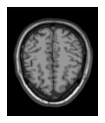

In [11]:
plt.figure(figsize=(2, 2))
print("T1 Image sample")
plt.imshow(imgT1, cmap='gray')
plt.axis('off')
plt.show()

T2 Image sample


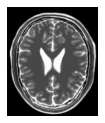

In [12]:
plt.figure(figsize=(2, 2))
print("T2 Image sample")
plt.imshow(imgT2, cmap='gray')
plt.axis('off')
plt.show()

#Data processing class
###1.   Data Read
###2.   Data Reshaping
###3.   Create Batch and Shuffle Data

In [13]:
class Utility:
    def __init__(self, sourcePath, resize):
       
        self.data = None
        self.sourcePath = sourcePath
        self.resize = resize
        self.imageSize = None

        self.prepareData()

    def prepareData(self):
        self.readFiles()
        self.dataPreprocess()

    def readFiles(self):
   
        # function to read the data files from the path specified ans return it in a list 
        # check if the path is valid or not
        if os.path.isdir(self.sourcePath):
            self.data = [imageio.imread(os.path.join(self.sourcePath, f)) for f in os.listdir(self.sourcePath)
                         if f.endswith(('.jpeg', '.jpg', '.png'))]

            self.imageSize = self.data[-1].shape

            if len(self.imageSize) != len(self.resize):
                raise Exception("Size mismatch!!")

        else:
            raise Exception("Path Invalid")

    def dataPreprocess(self):
        # normalize the data between -1 to +1
        normalized_data = (np.asarray(self.data, dtype=np.float32) / 127.5) - 1

        if len(self.imageSize) == 2:
            self.resize = (self.resize[0], self.resize[1], 1)
            self.imageSize = (self.imageSize[0], self.imageSize[1], 1)
            normalized_data.reshape((normalized_data.shape[0],self.imageSize[0],self.imageSize[1], self.imageSize[2]))


        final_shape = (normalized_data.shape[0], self.resize[0], self.resize[1], self.resize[2])

        self.data = np.zeros(final_shape, dtype=np.float32)
        for index, img in enumerate(normalized_data):
            self.data[index, :, :,:] = resize(img, self.resize)


    def get_data(self, batch_size):
        # batch and shuffle the data
        return tf.data.Dataset.from_tensor_slices(self.data).shuffle(self.data.shape[0], seed=42).batch(batch_size)


#Model Building
## Instance Normalisation

In [14]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

###CycleGAN
###1) Creating training flow / checkpoint 
###2) Discriminator and Generator
###3) Loss calculation and 

In [15]:
class CycleGAN:

    def __init__(self, input_shape,checkpoint_path):
        
        self.n_resnet = 3                                   #Add 3 unit of resnet_block[2 conv2d layers each]
        self.select="gd"                      
        self.discriminator_y = self.build_discriminator(input_shape)
        self.discriminator_x = self.build_discriminator(input_shape)
        self.generator_f = self.build_generator(input_shape)
        self.generator_g = self.build_generator(input_shape)

        ## Declare Loss as Binary Cross Entropy
        self.learning_rate_fn = tf.keras.optimizers.schedules.PolynomialDecay(0.01,350,0.000001,power=0.5)
        self.loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        self.generator_g_optimizer = tf.keras.optimizers.Adam(self.learning_rate_fn, beta_1=0.5)
        self.generator_f_optimizer = tf.keras.optimizers.Adam(self.learning_rate_fn, beta_1=0.5)

        self.discriminator_x_optimizer = tf.keras.optimizers.Adam(self.learning_rate_fn, beta_1=0.5)
        self.discriminator_y_optimizer = tf.keras.optimizers.Adam(self.learning_rate_fn, beta_1=0.5)

        self.checkpoint_path = checkpoint_path

        self.ckpt = tf.train.Checkpoint(generator_g=self.generator_g,
                                        generator_f=self.generator_f,
                                        discriminator_x=self.discriminator_x,
                                        discriminator_y=self.discriminator_y,
                                        generator_g_optimizer=self.generator_g_optimizer,
                                        generator_f_optimizer=self.generator_f_optimizer,
                                        discriminator_x_optimizer=self.discriminator_x_optimizer,
                                        discriminator_y_optimizer=self.discriminator_y_optimizer)

        self.ckpt_manager = tf.train.CheckpointManager(self.ckpt, self.checkpoint_path, max_to_keep=3)

        # if a checkpoint exists, restore the latest checkpoint.
        if self.ckpt_manager.latest_checkpoint:
            self.ckpt.restore(self.ckpt_manager.latest_checkpoint)
            print('Latest checkpoint restored!!')

    #Discriminator consists of two types of losses
    #1)Lossdiscriminator on Real Data
    #2)Loss on Fake Data
    def discriminator_loss(self, real, generated):
        real_loss = self.loss_obj(tf.ones_like(real), real)
        generated_loss = self.loss_obj(tf.zeros_like(generated), generated)
        total_disc_loss = real_loss + generated_loss
        return total_disc_loss * 0.5  # mean of losses

    #Discriminator Loss on Generated data
    def generator_loss(self, generated):
        return self.loss_obj(tf.ones_like(generated), generated)

    #When we use both of Generators sequentially on a Input Image,
    #we get Cycle Image and the L1 Loss between these two is called Cycle Loss.
    @staticmethod
    def calc_cycle_loss(real_image, cycled_image):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
        return 10.0 * loss1
    
    #When we provide input image to the Generator such that no translation is needed because the Image is already transformed. 
    #Here also we take L1 Loss between Input and Output Image.
    @staticmethod
    def identity_loss(real_image, same_image):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return 0.5 * loss

    ### Sequence of Training 
    
    # Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
    # Calculate Generator Loss on Discriminator.
    # Calculate Cycled Loss on Cycled Images from step 1 and 2.
    # Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
    # Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
    # Calculate the Gradients and update the weight and bias of models.
    @tf.function
    def train_step(self, real_x, real_y,):
        # persistent is set to True because the tape is used more than once to calculate the gradients.
        with tf.GradientTape(persistent=True) as tape:
            # Generator G translates X -> Y
            # Generator F translates Y -> X
            fake_y = self.generator_g(real_x, training=True)
            cycled_x = self.generator_f(fake_y, training=True)
            # Generate Fake Images through G and F for Identity Loss.
            fake_x = self.generator_f(real_y, training=True)
            cycled_y = self.generator_g(fake_x, training=True)

            # same_x and same_y are used for identity loss.
            same_x = self.generator_f(real_x, training=True)
            same_y = self.generator_g(real_y, training=True)

            disc_real_x = self.discriminator_x(real_x, training=True)
            disc_real_y = self.discriminator_y(real_y, training=True)

            disc_fake_x = self.discriminator_x(fake_x, training=True)
            disc_fake_y = self.discriminator_y(fake_y, training=True)

            # calculate the loss
            gen_g_loss = self.generator_loss(disc_fake_y)
            gen_f_loss = self.generator_loss(disc_fake_x)
            
            total_cycle_loss = self.calc_cycle_loss(real_x, cycled_x) + self.calc_cycle_loss(real_y, cycled_y)
            

              # Total generator loss = BCE loss + cycle loss + identity loss
            total_gen_g_loss = gen_g_loss + total_cycle_loss + self.identity_loss(real_y, same_y)
            total_gen_f_loss = gen_f_loss + total_cycle_loss + self.identity_loss(real_x, same_x)
            
            # Discriminator's loss
            disc_x_loss = self.discriminator_loss(disc_real_x, disc_fake_x)
            disc_y_loss = self.discriminator_loss(disc_real_y, disc_fake_y)
            
        # "self.select" helps in training/backpropogation of generator and discriminator individually for starting few epochs so they kind of overfit {Experimental}
        # Calculate the gradients for generator and discriminator
        if 'g' in self.select:
          generator_g_gradients = tape.gradient(total_gen_g_loss, self.generator_g.trainable_variables)
          generator_f_gradients = tape.gradient(total_gen_f_loss, self.generator_f.trainable_variables)
          self.generator_g_optimizer.apply_gradients(zip(generator_g_gradients, self.generator_g.trainable_variables))
          self.generator_f_optimizer.apply_gradients(zip(generator_f_gradients, self.generator_f.trainable_variables))
        if 'd' in self.select:
          discriminator_x_gradients = tape.gradient(disc_x_loss, self.discriminator_x.trainable_variables)
          discriminator_y_gradients = tape.gradient(disc_y_loss, self.discriminator_y.trainable_variables)
          self.discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                           self.discriminator_x.trainable_variables))
          self.discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                           self.discriminator_y.trainable_variables))

        # Apply the gradients to the optimizer
        # self.generator_g_optimizer.apply_gradients(zip(generator_g_gradients, self.generator_g.trainable_variables))
        # self.generator_f_optimizer.apply_gradients(zip(generator_f_gradients, self.generator_f.trainable_variables))

        # self.discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
        #                                                    self.discriminator_x.trainable_variables))
        # self.discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
        #                                                    self.discriminator_y.trainable_variables))

    def build_generator(self, image_shape):
        # weight initialization
        init = RandomNormal(stddev=0.02)
        # image input
        in_image = Input(shape=image_shape)
        # c7s1-64
        g = Conv2D(64, (3, 3), padding='same', kernel_initializer=init)(in_image)
        g = InstanceNormalization()(g)
        g = Activation('relu')(g)
        # d128
        g = Conv2D(128, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(g)
        g = InstanceNormalization()(g)
        g = Activation('relu')(g)
        # d256
        g = Conv2D(256, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(g)
        g = InstanceNormalization()(g)
        g = Activation('relu')(g)
        # R256
        for _ in range(self.n_resnet):
            g = self.resnet_block(256, g)
        # u128
        g = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(g)
        g = InstanceNormalization()(g)
        g = Activation('relu')(g)
        # u64
        g = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(g)
        g = InstanceNormalization()(g)
        g = Activation('relu')(g)
        # c7s1-3
        g = Conv2D(1, (3, 3), padding='same', kernel_initializer=init)(g)
        g = InstanceNormalization()(g)
        out_image = Activation('tanh')(g)
        # define model
        model = Model(in_image, out_image)
       # print("Generator Model:\n",model.summary())
        return model

    def build_discriminator(self, image_shape):
            # weight initialization
        init = RandomNormal(stddev=0.02)
        # source image input
        in_image = Input(shape=image_shape)
        # C64
        d = Conv2D(64, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(in_image)
        d = LeakyReLU(alpha=0.2)(d)
        # C128
        d = Conv2D(128, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(d)
        d = InstanceNormalization()(d)
        d = LeakyReLU(alpha=0.2)(d)
        # C256
        d = Conv2D(256, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(d)
        d = InstanceNormalization()(d)
        d = LeakyReLU(alpha=0.2)(d)
        # C512
        d = Conv2D(512, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)(d)
        d = InstanceNormalization()(d)
        d = LeakyReLU(alpha=0.2)(d)
        # second last output layer
        d = Conv2D(512, (3, 3), padding='same', kernel_initializer=init)(d)
        d = InstanceNormalization()(d)
        d = LeakyReLU(alpha=0.2)(d)
        # patch output
        patch_out = Conv2D(1, (3, 3), padding='same', kernel_initializer=init)(d)
        # define model
        model = Model(in_image, patch_out)
        #print("Discriminator Model:\n",model.summary())
        return model

    def train(self, data_x, data_y, epochs: int, my_drive, save_ckpt: bool = True,plot_results: bool = True, save_results:bool=True,
              sample_data: tuple = None, select_epochs = 0):
        for epoch in range(1, epochs + 1):
            self.select = str('gd' if epoch>10 else 'd') if epoch < select_epochs else 'gd'
            for image_x, image_y in tf.data.Dataset.zip((data_x, data_y)):
                self.train_step(image_x, image_y )

            if save_ckpt:
                ckpt_save_path = self.ckpt_manager.save()
                print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path.split("/")[-2:])
            ##Removing deleted ckpt's from trash to avoid storage full issue
            for a_file in my_drive.ListFile({'q': "trashed = true"}).GetList():
                a_file.Delete()

            if plot_results:
                if sample_data is None:
                    raise Exception("check if sample data is None")
                if len(sample_data) != 2:
                    raise Exception("sample data check shape")
                test_image_x, test_image_y = sample_data[0], sample_data[1]
                predictionX, predictionY = self.generate_images(test_image_x, test_image_y)
                plt.figure(figsize=(8, 4))
                display_list = [test_image_x[0], predictionX[0], test_image_y[0], predictionY[0]]
                title = ['InputImg_TypeT1', 'PredImg_TypeT2', 'InputImg_TypeT2', 'PredImg_TypeT1']
                for i in range(4):
                    plt.subplot(1, 4, i + 1)
                    plt.title(title[i])
                    plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
                    plt.axis('off')

                plt.savefig('result_img/image_at_epoch_{:04d}.png'.format(epoch))
                plt.show(block=False)
                time.sleep(5)
                plt.close('all')

    def resnet_block(self, n_filters, input_layer):
            # weight initialization
            init = RandomNormal(stddev=0.02)
            # first layer convolutional layer
            g = Conv2D(n_filters, (3, 3), padding='same', kernel_initializer=init)(input_layer)
            g = InstanceNormalization()(g)
            g = Activation('relu')(g)
            # second convolutional layer
            g = Conv2D(n_filters, (3, 3), padding='same', kernel_initializer=init)(g)
            g = InstanceNormalization()(g)
            # concatenate merge channel-wise with input layer
            g = Concatenate()([g, input_layer])
            return g

    def generate_images(self, image_x, image_y):
        prediction1 = self.generator_g(image_x)
        prediction2 = self.generator_f(image_y)
        return prediction1, prediction2


# after gan

In [16]:
def createGif(path2imgFiles, anim_file = 'GAN.gif'):
    with imageio.get_writer(anim_file, mode='I') as writer:
        imagesFilter = os.path.join(path2imgFiles, 'image*.png')
        filenames = glob.glob(imagesFilter)
        filenames = sorted(filenames)
        for i in range(0,len(filenames),3):
            image = imageio.imread(filenames[i])
            writer.append_data(image)
        image = imageio.imread(filenames[-1])
        writer.append_data(image)

Saving checkpoint for epoch 1 at ['Trained_Model', 'ckpt-1']


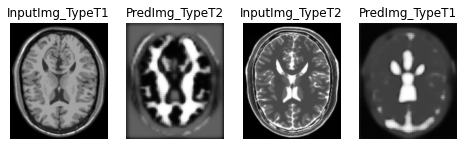

Saving checkpoint for epoch 2 at ['Trained_Model', 'ckpt-2']


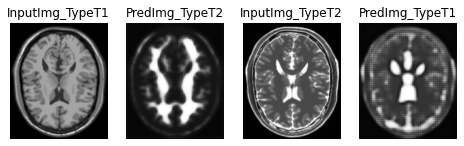

Saving checkpoint for epoch 3 at ['Trained_Model', 'ckpt-3']


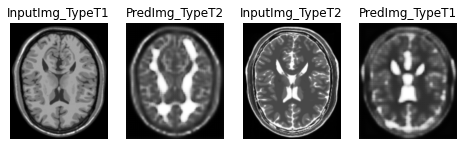

Saving checkpoint for epoch 4 at ['Trained_Model', 'ckpt-4']


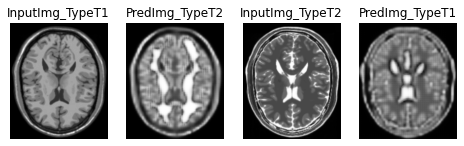

Saving checkpoint for epoch 5 at ['Trained_Model', 'ckpt-5']


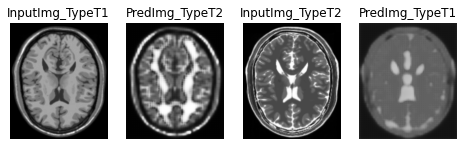

Saving checkpoint for epoch 6 at ['Trained_Model', 'ckpt-6']


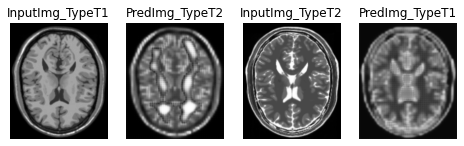

Saving checkpoint for epoch 7 at ['Trained_Model', 'ckpt-7']


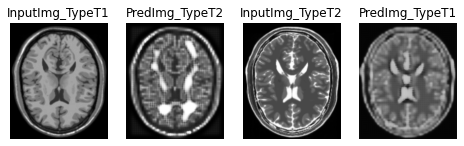

Saving checkpoint for epoch 8 at ['Trained_Model', 'ckpt-8']


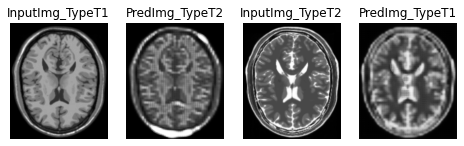

Saving checkpoint for epoch 9 at ['Trained_Model', 'ckpt-9']


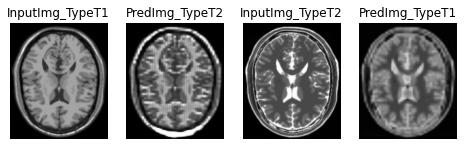

Saving checkpoint for epoch 10 at ['Trained_Model', 'ckpt-10']


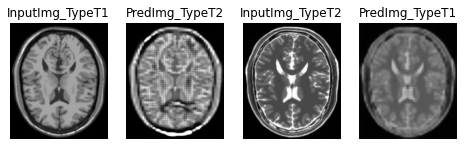

Saving checkpoint for epoch 11 at ['Trained_Model', 'ckpt-11']


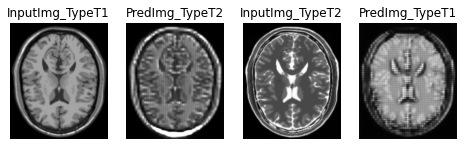

Saving checkpoint for epoch 12 at ['Trained_Model', 'ckpt-12']


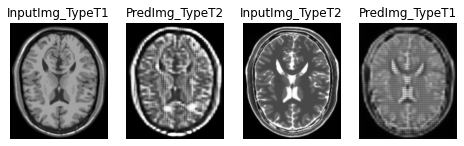

Saving checkpoint for epoch 13 at ['Trained_Model', 'ckpt-13']


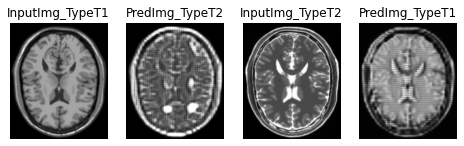

Saving checkpoint for epoch 14 at ['Trained_Model', 'ckpt-14']


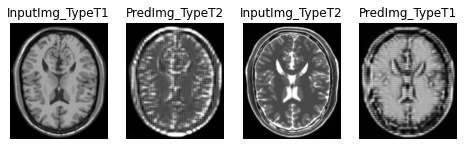

Saving checkpoint for epoch 15 at ['Trained_Model', 'ckpt-15']


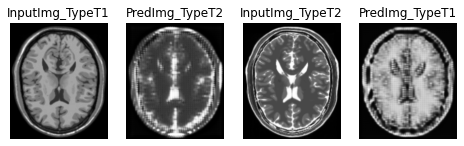

Saving checkpoint for epoch 16 at ['Trained_Model', 'ckpt-16']


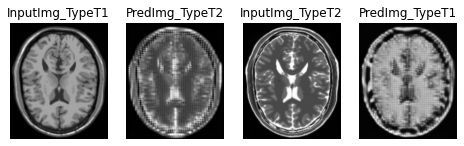

Saving checkpoint for epoch 17 at ['Trained_Model', 'ckpt-17']


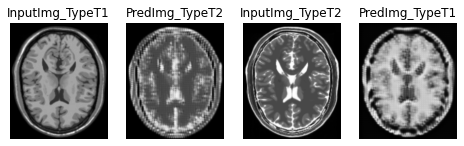

Saving checkpoint for epoch 18 at ['Trained_Model', 'ckpt-18']


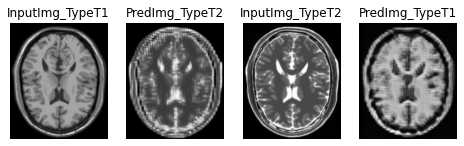

Saving checkpoint for epoch 19 at ['Trained_Model', 'ckpt-19']


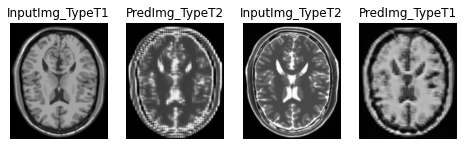

Saving checkpoint for epoch 20 at ['Trained_Model', 'ckpt-20']


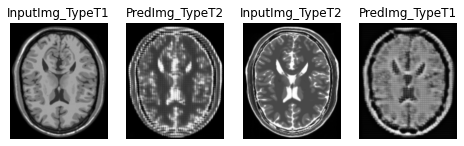

Saving checkpoint for epoch 21 at ['Trained_Model', 'ckpt-21']


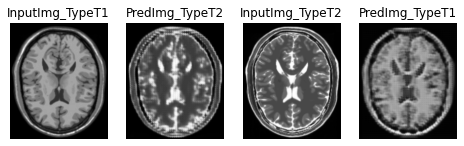

Saving checkpoint for epoch 22 at ['Trained_Model', 'ckpt-22']


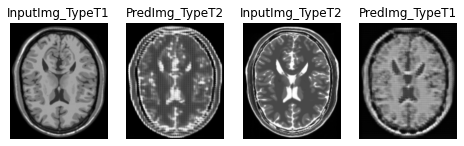

Saving checkpoint for epoch 23 at ['Trained_Model', 'ckpt-23']


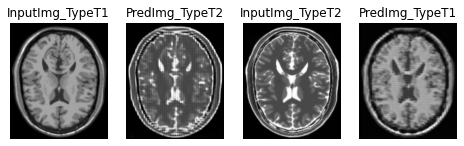

Saving checkpoint for epoch 24 at ['Trained_Model', 'ckpt-24']


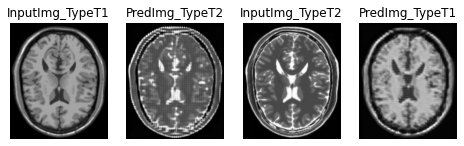

Saving checkpoint for epoch 25 at ['Trained_Model', 'ckpt-25']


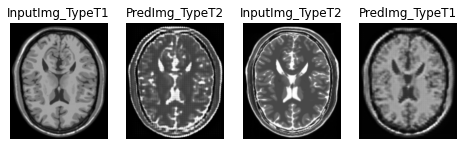

Saving checkpoint for epoch 26 at ['Trained_Model', 'ckpt-26']


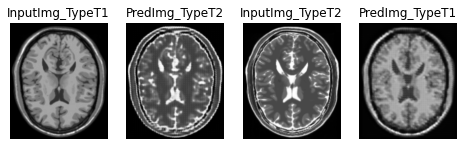

Saving checkpoint for epoch 27 at ['Trained_Model', 'ckpt-27']


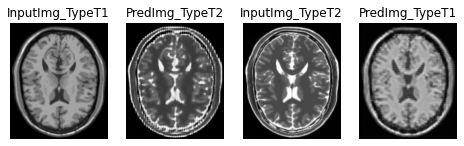

Saving checkpoint for epoch 28 at ['Trained_Model', 'ckpt-28']


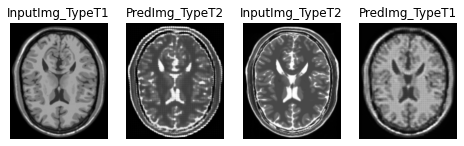

Saving checkpoint for epoch 29 at ['Trained_Model', 'ckpt-29']


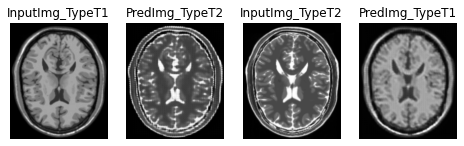

Saving checkpoint for epoch 30 at ['Trained_Model', 'ckpt-30']


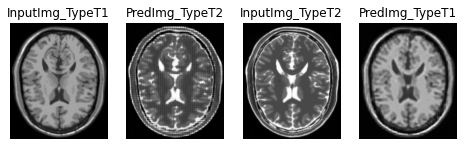

Saving checkpoint for epoch 31 at ['Trained_Model', 'ckpt-31']


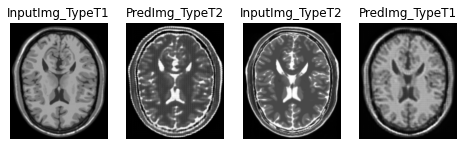

Saving checkpoint for epoch 32 at ['Trained_Model', 'ckpt-32']


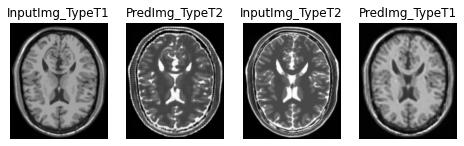

Saving checkpoint for epoch 33 at ['Trained_Model', 'ckpt-33']


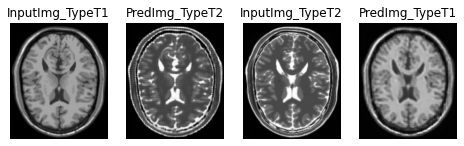

Saving checkpoint for epoch 34 at ['Trained_Model', 'ckpt-34']


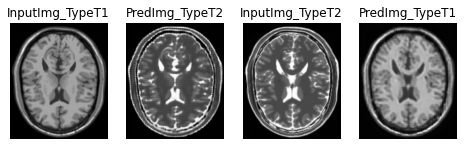

Saving checkpoint for epoch 35 at ['Trained_Model', 'ckpt-35']


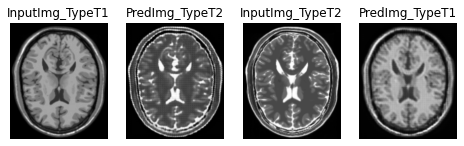

Saving checkpoint for epoch 36 at ['Trained_Model', 'ckpt-36']


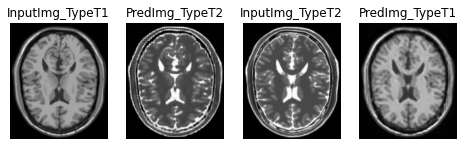

Saving checkpoint for epoch 37 at ['Trained_Model', 'ckpt-37']


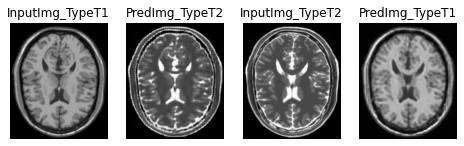

Saving checkpoint for epoch 38 at ['Trained_Model', 'ckpt-38']


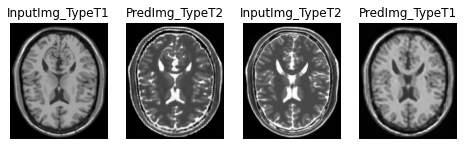

Saving checkpoint for epoch 39 at ['Trained_Model', 'ckpt-39']


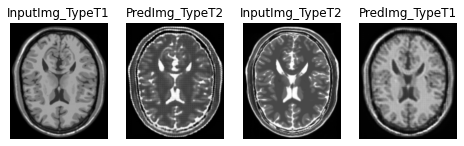

Saving checkpoint for epoch 40 at ['Trained_Model', 'ckpt-40']


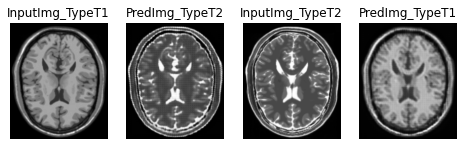

Saving checkpoint for epoch 41 at ['Trained_Model', 'ckpt-41']


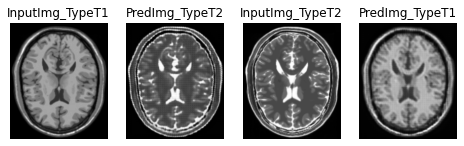

Saving checkpoint for epoch 42 at ['Trained_Model', 'ckpt-42']


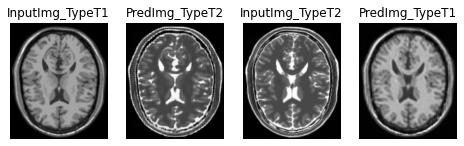

Saving checkpoint for epoch 43 at ['Trained_Model', 'ckpt-43']


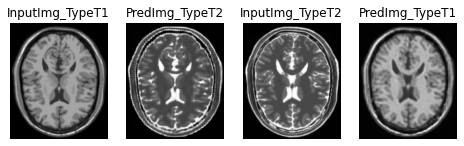

Saving checkpoint for epoch 44 at ['Trained_Model', 'ckpt-44']


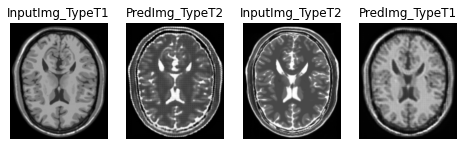

Saving checkpoint for epoch 45 at ['Trained_Model', 'ckpt-45']


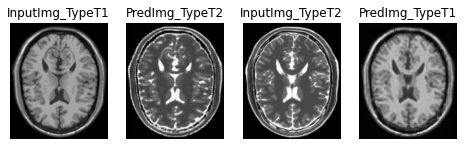

Saving checkpoint for epoch 46 at ['Trained_Model', 'ckpt-46']


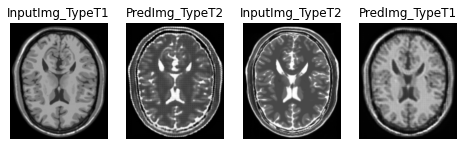

Saving checkpoint for epoch 47 at ['Trained_Model', 'ckpt-47']


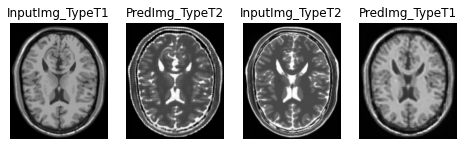

Saving checkpoint for epoch 48 at ['Trained_Model', 'ckpt-48']


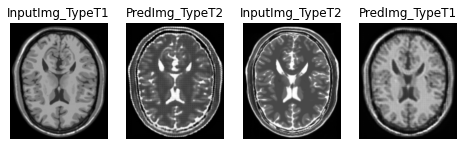

Saving checkpoint for epoch 49 at ['Trained_Model', 'ckpt-49']


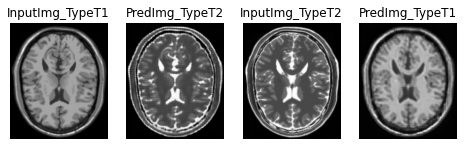

Saving checkpoint for epoch 50 at ['Trained_Model', 'ckpt-50']


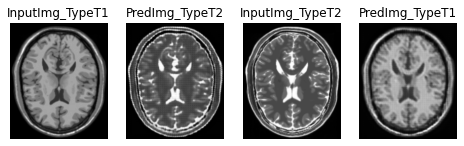

Saving checkpoint for epoch 51 at ['Trained_Model', 'ckpt-51']


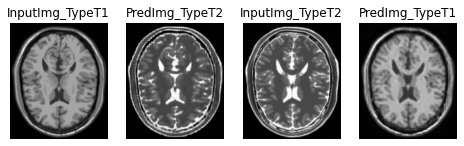

Saving checkpoint for epoch 52 at ['Trained_Model', 'ckpt-52']


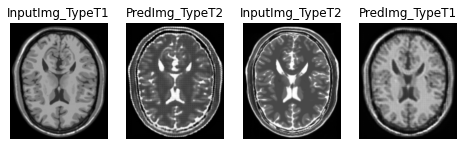

Saving checkpoint for epoch 53 at ['Trained_Model', 'ckpt-53']


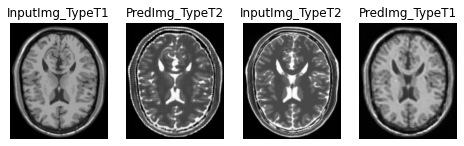

Saving checkpoint for epoch 54 at ['Trained_Model', 'ckpt-54']


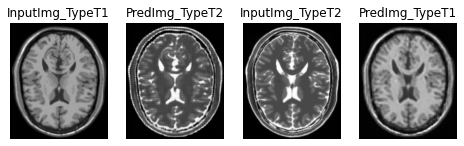

Saving checkpoint for epoch 55 at ['Trained_Model', 'ckpt-55']


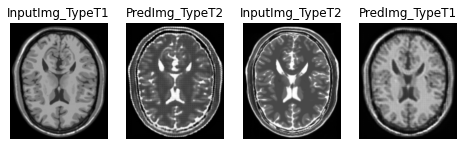

Saving checkpoint for epoch 56 at ['Trained_Model', 'ckpt-56']


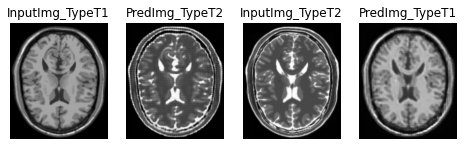

Saving checkpoint for epoch 57 at ['Trained_Model', 'ckpt-57']


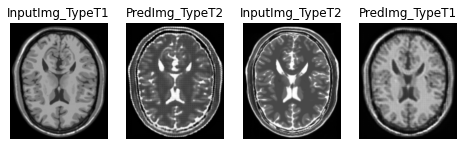

Saving checkpoint for epoch 58 at ['Trained_Model', 'ckpt-58']


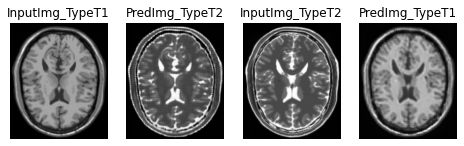

Saving checkpoint for epoch 59 at ['Trained_Model', 'ckpt-59']


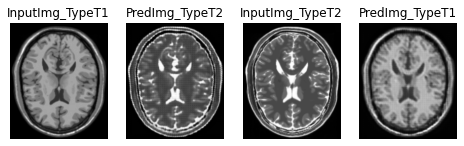

Saving checkpoint for epoch 60 at ['Trained_Model', 'ckpt-60']


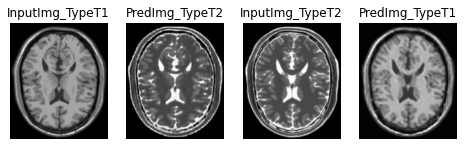

Saving checkpoint for epoch 61 at ['Trained_Model', 'ckpt-61']


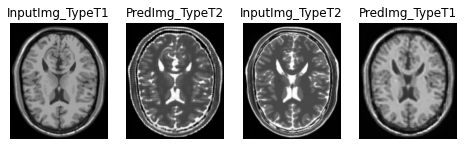

Saving checkpoint for epoch 62 at ['Trained_Model', 'ckpt-62']


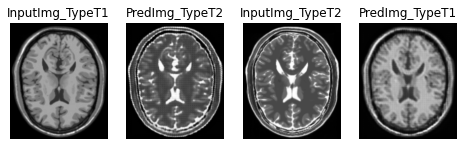

Saving checkpoint for epoch 63 at ['Trained_Model', 'ckpt-63']


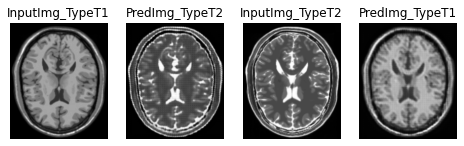

Saving checkpoint for epoch 64 at ['Trained_Model', 'ckpt-64']


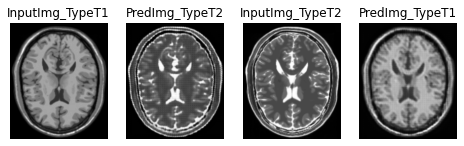

Saving checkpoint for epoch 65 at ['Trained_Model', 'ckpt-65']


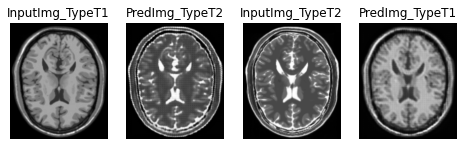

Saving checkpoint for epoch 66 at ['Trained_Model', 'ckpt-66']


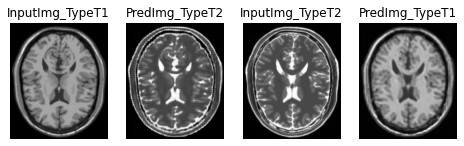

Saving checkpoint for epoch 67 at ['Trained_Model', 'ckpt-67']


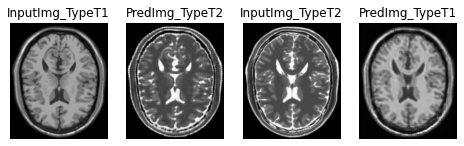

Saving checkpoint for epoch 68 at ['Trained_Model', 'ckpt-68']


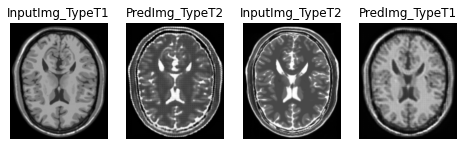

Saving checkpoint for epoch 69 at ['Trained_Model', 'ckpt-69']


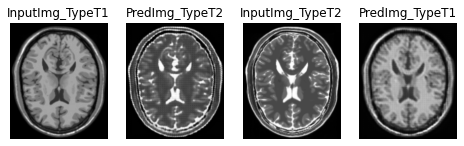

Saving checkpoint for epoch 70 at ['Trained_Model', 'ckpt-70']


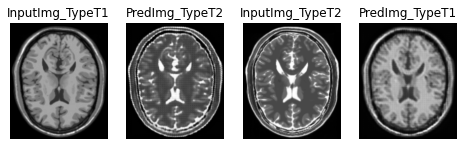

Saving checkpoint for epoch 71 at ['Trained_Model', 'ckpt-71']


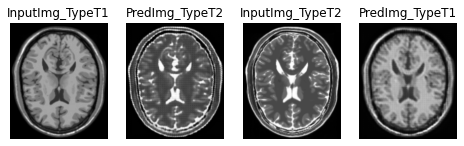

Saving checkpoint for epoch 72 at ['Trained_Model', 'ckpt-72']


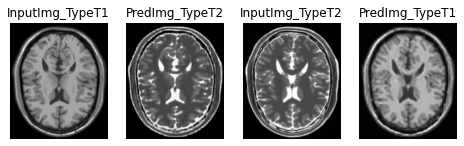

Saving checkpoint for epoch 73 at ['Trained_Model', 'ckpt-73']


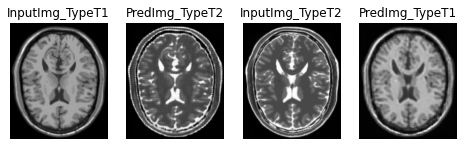

Saving checkpoint for epoch 74 at ['Trained_Model', 'ckpt-74']


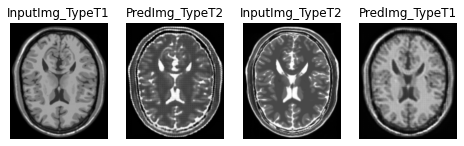

Saving checkpoint for epoch 75 at ['Trained_Model', 'ckpt-75']


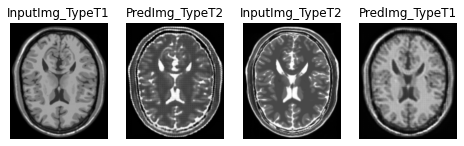

Saving checkpoint for epoch 76 at ['Trained_Model', 'ckpt-76']


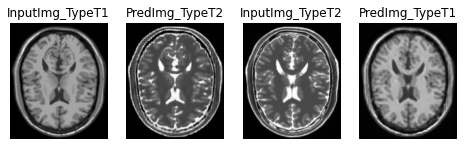

Saving checkpoint for epoch 77 at ['Trained_Model', 'ckpt-77']


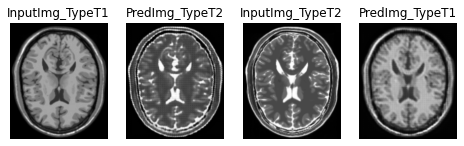

Saving checkpoint for epoch 78 at ['Trained_Model', 'ckpt-78']


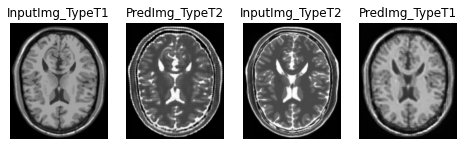

Saving checkpoint for epoch 79 at ['Trained_Model', 'ckpt-79']


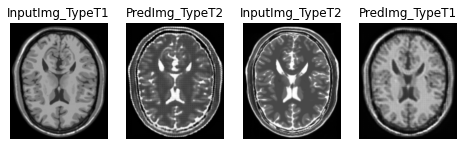

Saving checkpoint for epoch 80 at ['Trained_Model', 'ckpt-80']


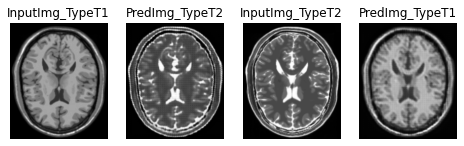

Saving checkpoint for epoch 81 at ['Trained_Model', 'ckpt-81']


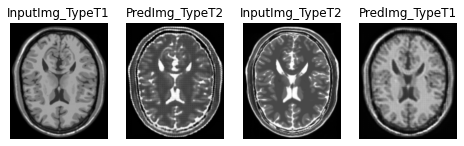

Saving checkpoint for epoch 82 at ['Trained_Model', 'ckpt-82']


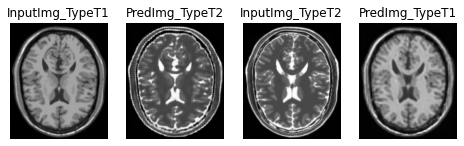

Saving checkpoint for epoch 83 at ['Trained_Model', 'ckpt-83']


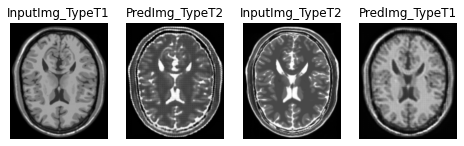

Saving checkpoint for epoch 84 at ['Trained_Model', 'ckpt-84']


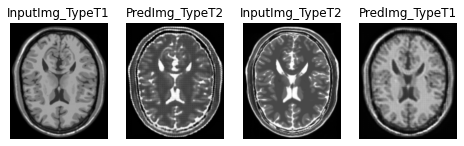

Saving checkpoint for epoch 85 at ['Trained_Model', 'ckpt-85']


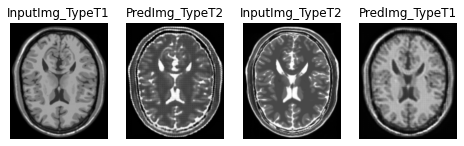

Saving checkpoint for epoch 86 at ['Trained_Model', 'ckpt-86']


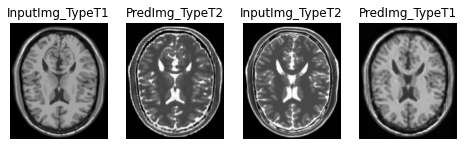

Saving checkpoint for epoch 87 at ['Trained_Model', 'ckpt-87']


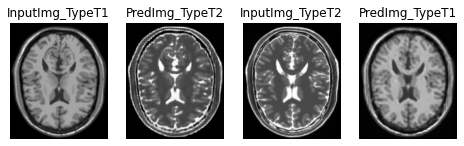

Saving checkpoint for epoch 88 at ['Trained_Model', 'ckpt-88']


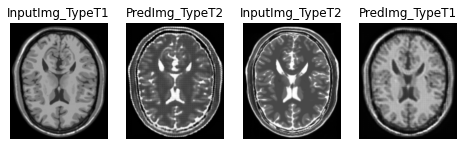

Saving checkpoint for epoch 89 at ['Trained_Model', 'ckpt-89']


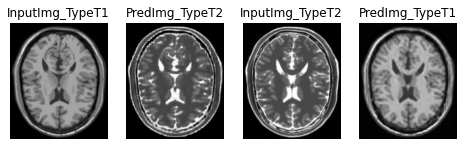

Saving checkpoint for epoch 90 at ['Trained_Model', 'ckpt-90']


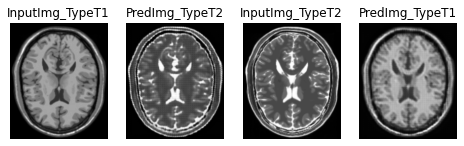

Saving checkpoint for epoch 91 at ['Trained_Model', 'ckpt-91']


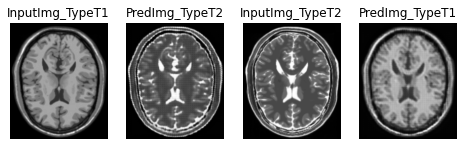

Saving checkpoint for epoch 92 at ['Trained_Model', 'ckpt-92']


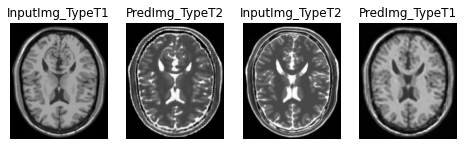

Saving checkpoint for epoch 93 at ['Trained_Model', 'ckpt-93']


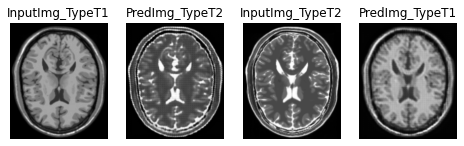

Saving checkpoint for epoch 94 at ['Trained_Model', 'ckpt-94']


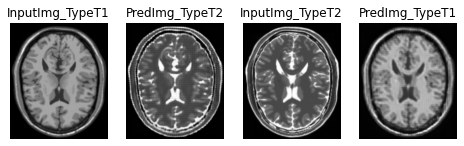

Saving checkpoint for epoch 95 at ['Trained_Model', 'ckpt-95']


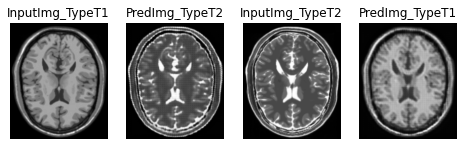

Saving checkpoint for epoch 96 at ['Trained_Model', 'ckpt-96']


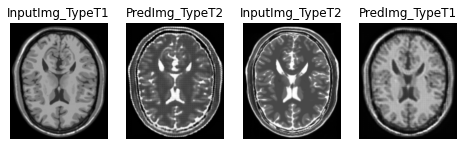

Saving checkpoint for epoch 97 at ['Trained_Model', 'ckpt-97']


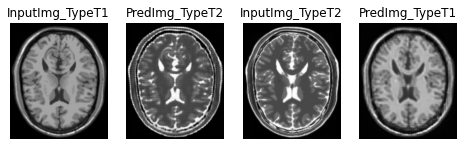

Saving checkpoint for epoch 98 at ['Trained_Model', 'ckpt-98']


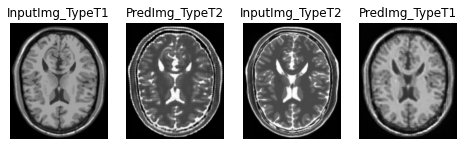

Saving checkpoint for epoch 99 at ['Trained_Model', 'ckpt-99']


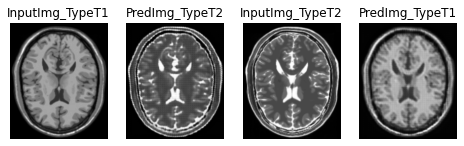

Saving checkpoint for epoch 100 at ['Trained_Model', 'ckpt-100']


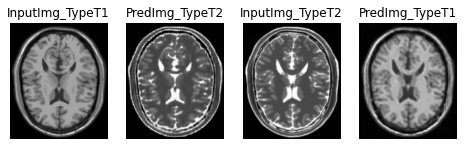

Saving checkpoint for epoch 101 at ['Trained_Model', 'ckpt-101']


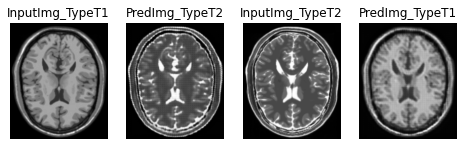

Saving checkpoint for epoch 102 at ['Trained_Model', 'ckpt-102']


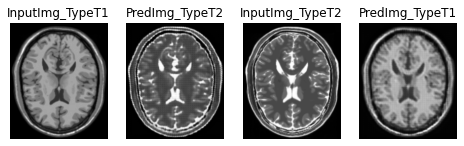

Saving checkpoint for epoch 103 at ['Trained_Model', 'ckpt-103']


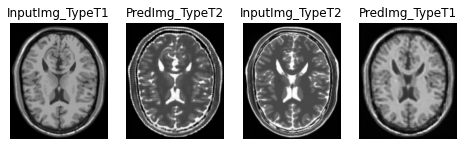

Saving checkpoint for epoch 104 at ['Trained_Model', 'ckpt-104']


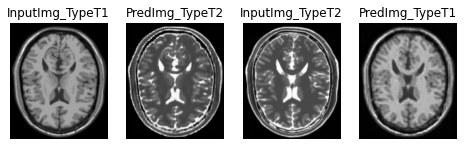

Saving checkpoint for epoch 105 at ['Trained_Model', 'ckpt-105']


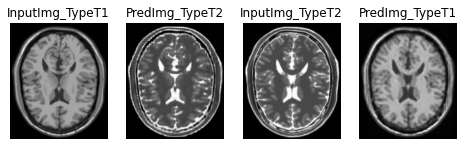

Saving checkpoint for epoch 106 at ['Trained_Model', 'ckpt-106']


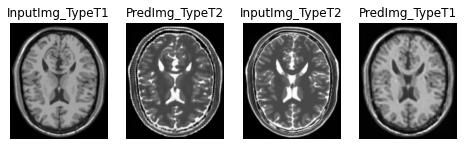

Saving checkpoint for epoch 107 at ['Trained_Model', 'ckpt-107']


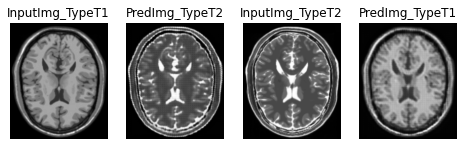

Saving checkpoint for epoch 108 at ['Trained_Model', 'ckpt-108']


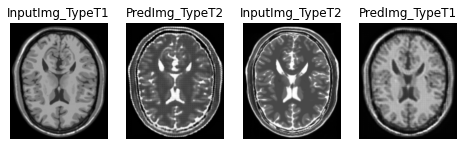

Saving checkpoint for epoch 109 at ['Trained_Model', 'ckpt-109']


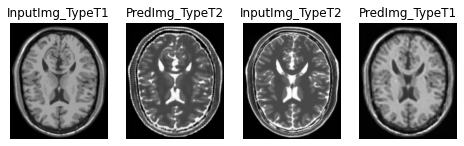

Saving checkpoint for epoch 110 at ['Trained_Model', 'ckpt-110']


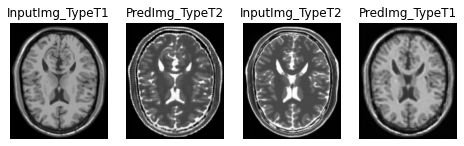

Saving checkpoint for epoch 111 at ['Trained_Model', 'ckpt-111']


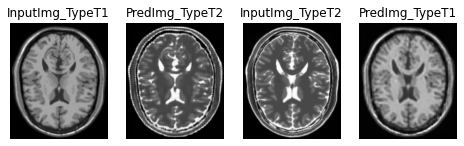

Saving checkpoint for epoch 112 at ['Trained_Model', 'ckpt-112']


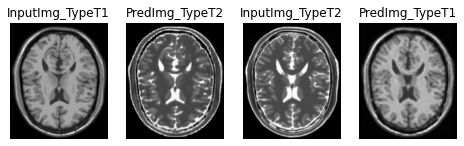

Saving checkpoint for epoch 113 at ['Trained_Model', 'ckpt-113']


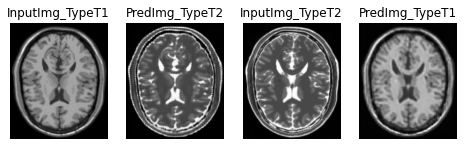

Saving checkpoint for epoch 114 at ['Trained_Model', 'ckpt-114']


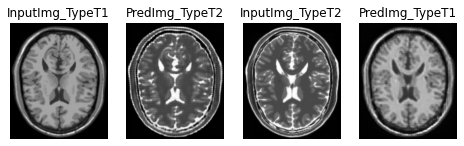

Saving checkpoint for epoch 115 at ['Trained_Model', 'ckpt-115']


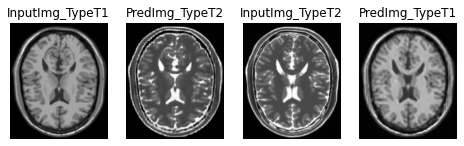

Saving checkpoint for epoch 116 at ['Trained_Model', 'ckpt-116']


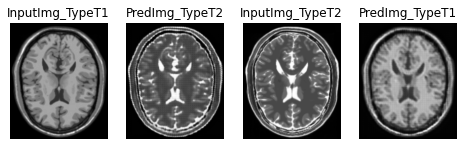

Saving checkpoint for epoch 117 at ['Trained_Model', 'ckpt-117']


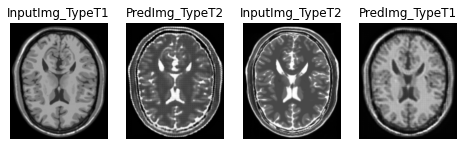

Saving checkpoint for epoch 118 at ['Trained_Model', 'ckpt-118']


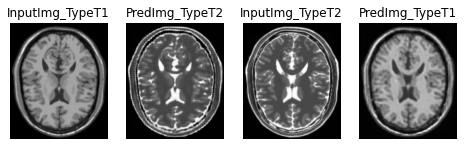

Saving checkpoint for epoch 119 at ['Trained_Model', 'ckpt-119']


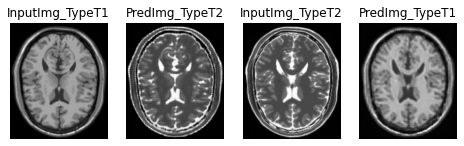

Saving checkpoint for epoch 120 at ['Trained_Model', 'ckpt-120']


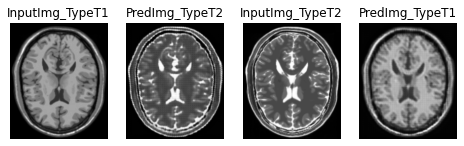

Saving checkpoint for epoch 121 at ['Trained_Model', 'ckpt-121']


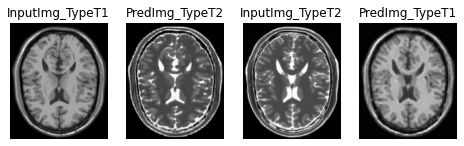

Saving checkpoint for epoch 122 at ['Trained_Model', 'ckpt-122']


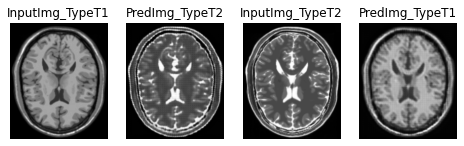

Saving checkpoint for epoch 123 at ['Trained_Model', 'ckpt-123']


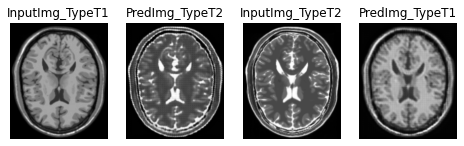

Saving checkpoint for epoch 124 at ['Trained_Model', 'ckpt-124']


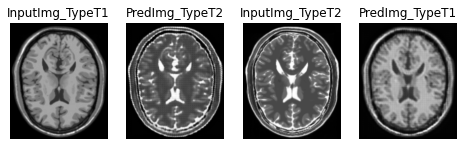

Saving checkpoint for epoch 125 at ['Trained_Model', 'ckpt-125']


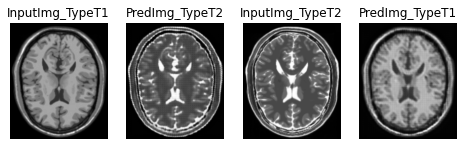

Saving checkpoint for epoch 126 at ['Trained_Model', 'ckpt-126']


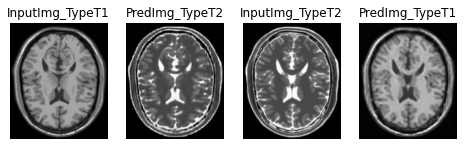

Saving checkpoint for epoch 127 at ['Trained_Model', 'ckpt-127']


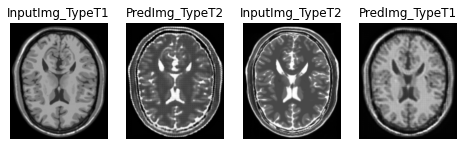

Saving checkpoint for epoch 128 at ['Trained_Model', 'ckpt-128']


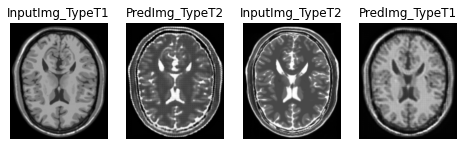

Saving checkpoint for epoch 129 at ['Trained_Model', 'ckpt-129']


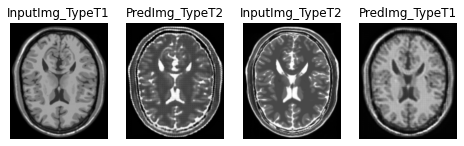

Saving checkpoint for epoch 130 at ['Trained_Model', 'ckpt-130']


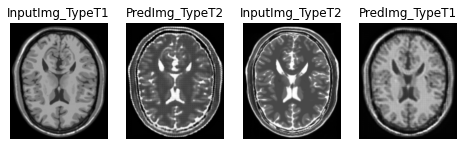

Saving checkpoint for epoch 131 at ['Trained_Model', 'ckpt-131']


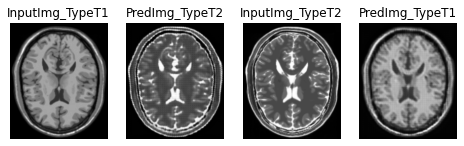

Saving checkpoint for epoch 132 at ['Trained_Model', 'ckpt-132']


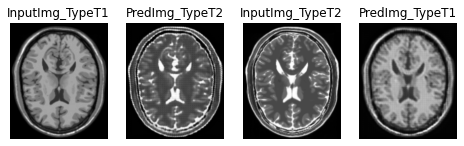

Saving checkpoint for epoch 133 at ['Trained_Model', 'ckpt-133']


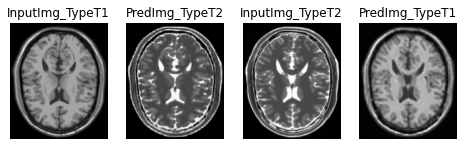

Saving checkpoint for epoch 134 at ['Trained_Model', 'ckpt-134']


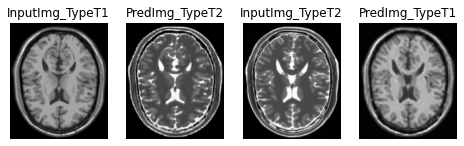

Saving checkpoint for epoch 135 at ['Trained_Model', 'ckpt-135']


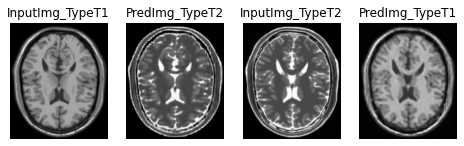

Saving checkpoint for epoch 136 at ['Trained_Model', 'ckpt-136']


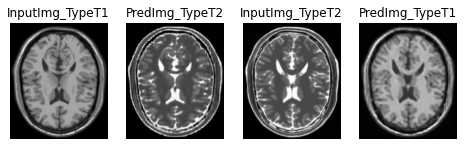

Saving checkpoint for epoch 137 at ['Trained_Model', 'ckpt-137']


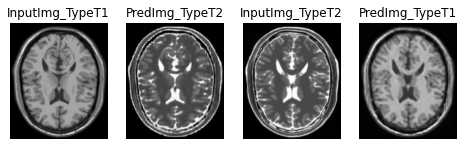

Saving checkpoint for epoch 138 at ['Trained_Model', 'ckpt-138']


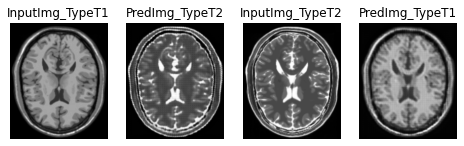

Saving checkpoint for epoch 139 at ['Trained_Model', 'ckpt-139']


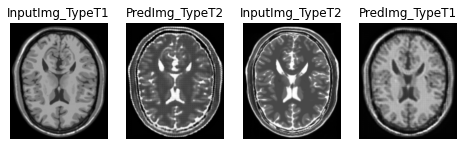

Saving checkpoint for epoch 140 at ['Trained_Model', 'ckpt-140']


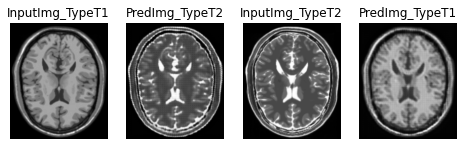

Saving checkpoint for epoch 141 at ['Trained_Model', 'ckpt-141']


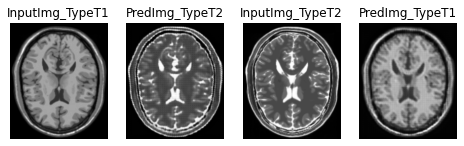

Saving checkpoint for epoch 142 at ['Trained_Model', 'ckpt-142']


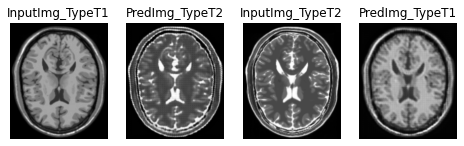

Saving checkpoint for epoch 143 at ['Trained_Model', 'ckpt-143']


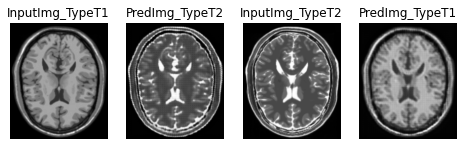

Saving checkpoint for epoch 144 at ['Trained_Model', 'ckpt-144']


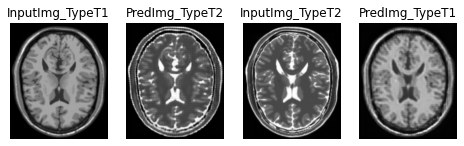

Saving checkpoint for epoch 145 at ['Trained_Model', 'ckpt-145']


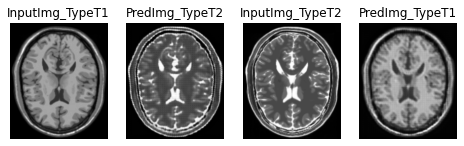

Saving checkpoint for epoch 146 at ['Trained_Model', 'ckpt-146']


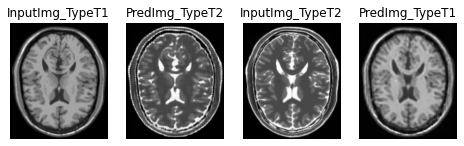

Saving checkpoint for epoch 147 at ['Trained_Model', 'ckpt-147']


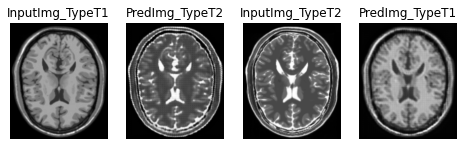

Saving checkpoint for epoch 148 at ['Trained_Model', 'ckpt-148']


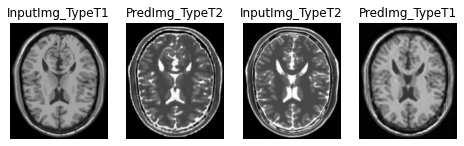

Saving checkpoint for epoch 149 at ['Trained_Model', 'ckpt-149']


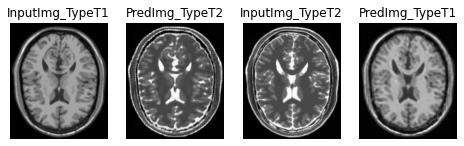

Saving checkpoint for epoch 150 at ['Trained_Model', 'ckpt-150']


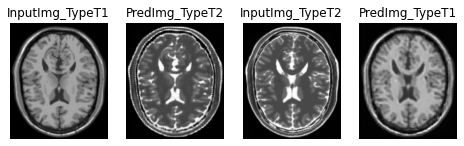

In [19]:
if __name__ == '__main__':
    img_path = os.path.join(os.getcwd(), 'result_img')
    pathforTR1 = os.path.join(os.getcwd(), 'Tr1', 'TrainT1')
    pathforTR2 = os.path.join(os.getcwd(), 'Tr2', 'TrainT2')
    checkpoint_path = os.path.join(os.getcwd(), 'Trained_Model')

    if not os.path.isdir(checkpoint_path):
        os.mkdir(checkpoint_path)

    batch_size = 4
    epochs = 150
    # load images from
    images_x = Utility(pathforTR1, (220,184)).get_data(batch_size)
    images_y = Utility(pathforTR2, (220,184)).get_data(batch_size)

    sample_x_data = next(iter(images_x))
    sample_y_data = next(iter(images_y))

    cycleGan = CycleGAN((220,184,1), checkpoint_path)

    cycleGan.train(images_x, images_y, epochs,my_drive,plot_results=True, sample_data=(sample_x_data, sample_y_data), select_epochs=0)
    createGif(img_path)

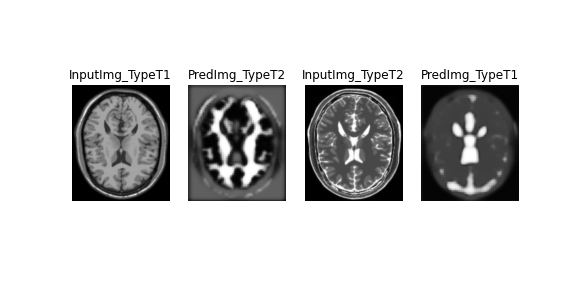

In [20]:
from IPython.display import Image
Image(open('GAN.gif','rb').read())

# Result

The data is less, and augmentation was not a good idea(i think), considering each human part in MRI image does uses word like right left central cortex/lobe or so.(orientation matters)

Number of layers are used in Generator function including using resnet methodology in customised way.

Result of using polynomial decay in learning rate has given best result out of all tried variations.

When we tried to increase learning by overfitting the data by training generator and discriminator individually a little, before using them in cycle for training, results were good but the submitted model supercedes all other results.




